# <p style="padding:20px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-size:100%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:500; box-shadow: 2px 2px 5px #888888;">Détection de maladie sur des plantes 🌱</p>


<a id="0"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Table des matières 📝</p>

<div style='border: 3px solid none; background-color:#ECFFDC; font-size:110%; padding:10px'>
    
* **[1. Une brève explication](#1)**
   - Détection des maladies des végétaux
   - Pourquoi TensorFlow et CNN
    

* **[2. Importation des librairies ](#2)**
   - Les librairies nécessaires
    

* **[3. Importation du dataset ](#3)**
   - Utilisation des répertoires
   - Préparation des données d'entraînement et de validation
    

* **[4. Prétraitement des données ](#4)**
   - Redimensionnement et normalisation des images
   - Affichage de la distribution des classes
    

* **[5. Réseau de neurones convolutifs (CNN) ](#5)**
   - Création du modèle MobileNetV2 pré-entraîné
   - Compilation du modèle
   - Entraînement du modèle avec EarlyStopping
    

* **[6. Interprétation des résultats ](#6)**
   - Évaluation du modèle
   - Affichage des courbes de précision et de perte
   - Matrice de confusion et rapport de classification
    

* **[7. Teste du modèle ](#7)**
   - Prédiction sur une image
   - Prédiction sur un lot d'images
</div>

<a id="1"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Une brève explication 🗨️</p>

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


* **Détection des maladies végétales?**

  - La détection des maladies des plantes est cruciale pour plusieurs raisons:

    **Productivité agricole :** La détection précoce des maladies peut prévenir les épidémies généralisées, ce qui assure la santé et le rendement des cultures.
    
    **Impact économique :** La réduction des pertes de récoltes dues aux maladies a une incidence directe sur la stabilité économique des agriculteurs et du secteur agricole.
    
    **Sécurité alimentaire :** La protection des cultures contre les maladies est essentielle pour maintenir un approvisionnement alimentaire stable pour la population mondiale croissante.
    
    **Protection de l’environnement :** Une gestion efficace des maladies réduit le besoin de traitements chimiques, ce qui protège l’environnement.

![Plant Disease Detection](https://www.ischool.berkeley.edu/sites/default/files/styles/facebook_image/public/sproject_teaser_image/reversed.jpg?itok=3LvOgtIi)

<div style='border: 3px solid none; background-color:#ECFFDC; padding:10px'>

* **Pourquoi TensorFlow et CNN?**

  - Les réseaux neuronaux convolutionnels (CNN) avec TensorFlow sont particulièrement bien adaptés à la détection des maladies des plantes pour plusieurs raisons :

    **Facilité d’utilisation :** TensorFlow offre une plateforme flexible pour la recherche et le développement en apprentissage profond, qui est facile à utiliser pour les débutants comme pour les experts.
    
    **Support et écosystème :** TensorFlow a une vaste communauté et un large support d'écosystème, avec de nombreux outils et bibliothèques qui facilitent le développement et le déploiement de modèles d'apprentissage profond.
    
    **Extraction efficace des caractéristiques :** Les CNN sont très efficaces pour extraire des caractéristiques hiérarchiques à partir d’images, ce qui est crucial pour identifier les modèles indiquant des maladies des plantes.
    
    **Progrès en matière d’apprentissage profond :** L’apprentissage profond, particulièrement les CNN, a fait des percées importantes dans le traitement numérique de l’image, surpassant les méthodes traditionnelles en termes de précision et d’efficacité.
    
    **Performance optimisée :** TensorFlow permet l'optimisation des modèles pour des déploiements sur divers environnements, allant des serveurs aux appareils mobiles, assurant une performance rapide et efficace pour les applications de détection en temps réel.

</div>

<a id="2"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Importation des librairies 🗃️</p>

In [27]:
import warnings
warnings.filterwarnings('ignore')

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.metrics import classification_report , confusion_matrix , accuracy_score , auc
from sklearn.model_selection import train_test_split

!pip install tensorflow keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

<a id="3"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Importation du dataset 🖼️</p>

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


* **Répertoires d’utilisation**

  - La racine principale du jeu de données contient 2 dossiers (New Plant Diseases Dataset (Augmented)) et (Test). Dans la première, on peut voir le répertoire de **Train** et **Valid** et dans la seconde, on a nos images **Test**.

In [28]:
train_path = "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"
valid_path = "/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"

<a id="4"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Prétraîtement des données 🧭</p>

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


* **Nom des classes et nombre de classes**

  - Combien de classes sont dans l’ensemble de données?

In [29]:
train_data = tf.keras.preprocessing.image_dataset_from_directory(
 train_path,
    batch_size=256,
  image_size=(224,224), shuffle=True
)

Found 70295 files belonging to 38 classes.


In [30]:
valid_data = tf.keras.preprocessing.image_dataset_from_directory(
 valid_path,
    batch_size=256,
  image_size=(224,224), shuffle=True
)

Found 17572 files belonging to 38 classes.


In [31]:
path = "/kaggle/input/new-plant-diseases-dataset/test/test"
test_folder = os.listdir(path)
test_folder[:5]

['TomatoEarlyBlight6.JPG',
 'TomatoYellowCurlVirus4.JPG',
 'TomatoYellowCurlVirus6.JPG',
 'PotatoHealthy2.JPG',
 'TomatoYellowCurlVirus5.JPG']

In [32]:
len(train_data.class_names)

38

In [33]:
# Show all the class names
class_labels = train_data.class_names
class_labels

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Blueberry___healthy',
 'Cherry_(including_sour)___Powdery_mildew',
 'Cherry_(including_sour)___healthy',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Corn_(maize)___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_

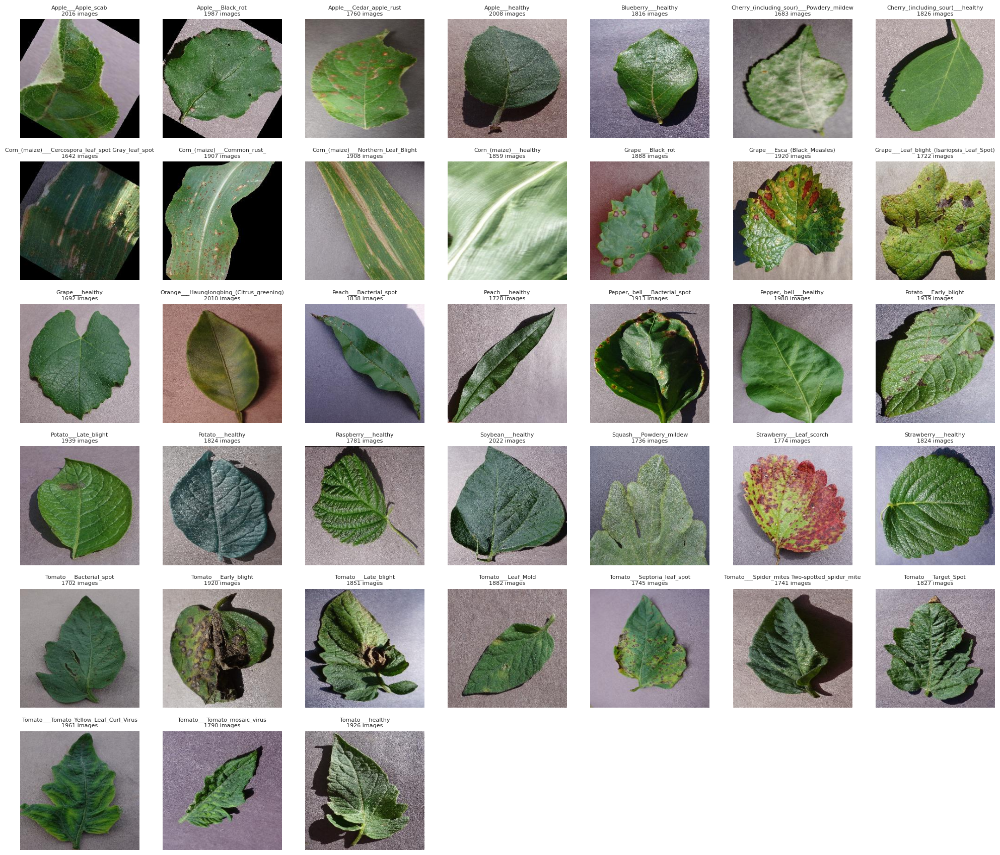

Total Number of Images in Directory:  70295


In [34]:
# Function to count images in each class
def count_images_in_classes(data_path, class_labels):
    class_image_counts = {}
    for class_name in class_labels:
        class_dir = os.path.join(data_path, class_name)
        class_image_counts[class_name] = len(os.listdir(class_dir))
    return class_image_counts

# Get the count of images in each class
train_image_counts = count_images_in_classes(train_path, class_labels)

# Plotting the number of images per class and showing an example image from each class
plt.figure(figsize=(20, 20))
cnt = 0
for class_name, count in train_image_counts.items():
    cnt += 1
    plt.subplot(7, 7, cnt)
    class_dir = os.path.join(train_path, class_name)
    img_path = os.path.join(class_dir, os.listdir(class_dir)[0])
    img = plt.imread(img_path)
    plt.imshow(img)
    plt.title(f"{class_name}\n{count} images", fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()

# Print total number of images
total_images = sum(train_image_counts.values())
print("Total Number of Images in Directory: ", total_images)

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


* **Comparaison du nombre de classes**

  - Il est très important de savoir quelles classes ont le plus d’images et lesquelles ont le moins.

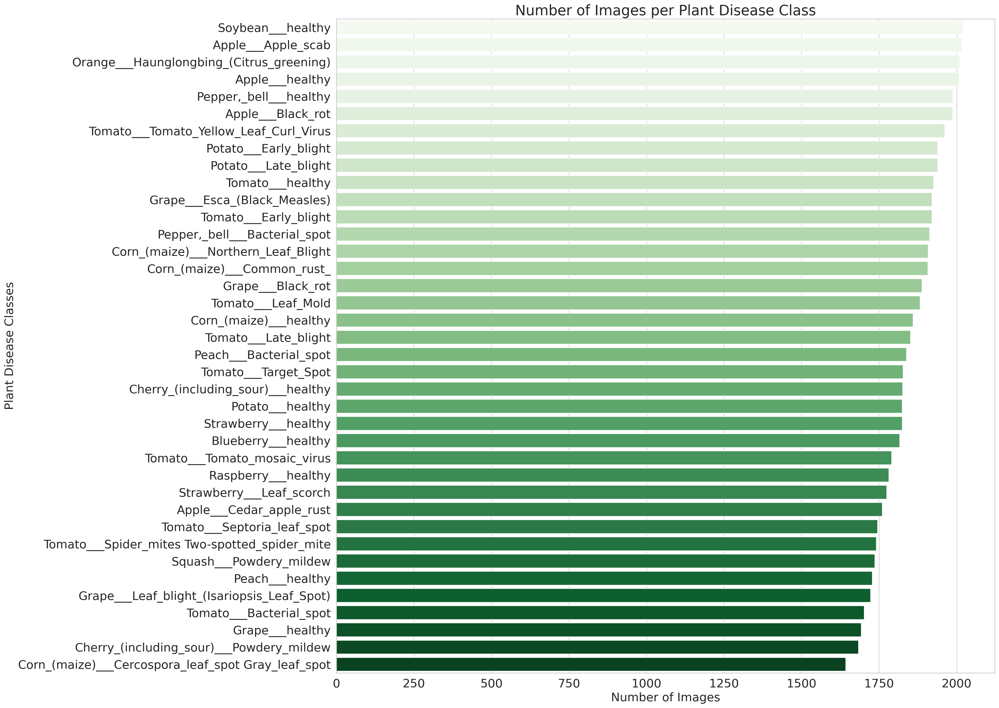

In [35]:
# Preparing data for the bar plot
plant_names = list(train_image_counts.keys())
Len = list(train_image_counts.values())

# Sorting the data
sorted_indices = sorted(range(len(Len)), key=lambda k: Len[k], reverse=True)
plant_names_sorted = [plant_names[i] for i in sorted_indices]
Len_sorted = [Len[i] for i in sorted_indices]

# Plotting the bar plot
sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(20, 20), dpi=200)
ax = sns.barplot(x=Len_sorted, y=plant_names_sorted, palette="Greens")
plt.xlabel('Number of Images', fontsize=20)
plt.ylabel('Plant Disease Classes', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('Number of Images per Plant Disease Class', fontsize=24)
plt.show()

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

* **ImageDataGenerator / flow_from_directory**

  - La classe `ImageDataGenerator` de TensorFlow, faisant partie de la bibliothèque Keras, est un outil polyvalent conçu pour gérer les ensembles de données d'images. Elle simplifie le processus de chargement et de prétraitement des données d'image pour l'entraînement des modèles de machine learning. Examinons ses détails :

* **Objectif**: La classe `ImageDataGenerator` est utilisée pour charger et augmenter les données d'image à partir d'une structure de répertoire où les images sont organisées en sous-dossiers représentant différentes classes ou catégories. Par défaut, elle suppose la structure de répertoires suivante :

```plaintext
root_dir/
    class_a/
        img1.jpg
        img2.jpg
        ...
    class_b/
        img1.jpg
        img2.jpg
        ...
    ...
```

In [36]:
datagen = ImageDataGenerator(rescale=1.0/255.0)

# Use the 'datagen' to preprocess the images loaded by 'image_data_from_directory'
train_scaled_data = datagen.flow_from_directory(
    train_path,
    target_size=(224, 224),
    batch_size=256,shuffle=True,
    class_mode='sparse'
)

valid_scaled_data = datagen.flow_from_directory(
    valid_path,
    target_size=(224, 224),
    batch_size=256,shuffle=False,
    class_mode='sparse'
)

Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.


<div style='border: 3px solid none; background-color:#ECFFDC; padding:10px'>

"datagen = ImageDataGenerator(rescale=1.0/255.0)" crée un générateur d'images avec une normalisation des pixels.

* rescale=1.0/255.0 : Les valeurs des pixels des images sont mises à l'échelle de [0, 255] à [0, 1] pour normaliser les données.

Le générateur 'datagen' est utilisé pour prétraiter les images chargées par 'flow_from_directory'.

"train_scaled_data = datagen.flow_from_directory(...)"
* train_path : Chemin vers le répertoire contenant les images d'entraînement.
* target_size=(224, 224) : Les images sont redimensionnées à 224x224 pixels.
* batch_size=256 : Les images sont traitées en lots de 256.
* shuffle=True : Les images sont mélangées à chaque époque pour l'entraînement.
* class_mode='sparse' : Les étiquettes de classe sont retournées sous forme d'entiers.

"valid_scaled_data = datagen.flow_from_directory(...)"
* valid_path : Chemin vers le répertoire contenant les images de validation.
* target_size=(224, 224) : Les images sont redimensionnées à 224x224 pixels.
* batch_size=256 : Les images sont traitées en lots de 256.
* shuffle=False : Les images ne sont pas mélangées, ce qui est important pour l'évaluation correcte des performances.
* class_mode='sparse' : Les étiquettes de classe sont retournées sous forme d'entiers.

</div>

In [37]:
train_scaled_data.class_indices

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

In [38]:
for img, label in train_scaled_data:
    print(img[0].shape)
    print(label[0])
    break

(224, 224, 3)
32.0


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


"img[0].shape()" indique la forme de la première image dans le lot d'images.

* 224 : Hauteur de l'image en pixels.
* 224 : Largeur de l'image en pixels.
* 3 : Nombre de canaux de couleur (RVB - Rouge, Vert, Bleu).

"label[0]" indique l'étiquette de la première image dans le lot d'images.

* 14.0 : Index de la classe auquel appartient l'image. Les étiquettes de classe sont encodées sous forme d'entiers représentant différentes classes dans votre ensemble de données.

In [39]:
label[10]

1.0

In [40]:
len(class_labels)

38

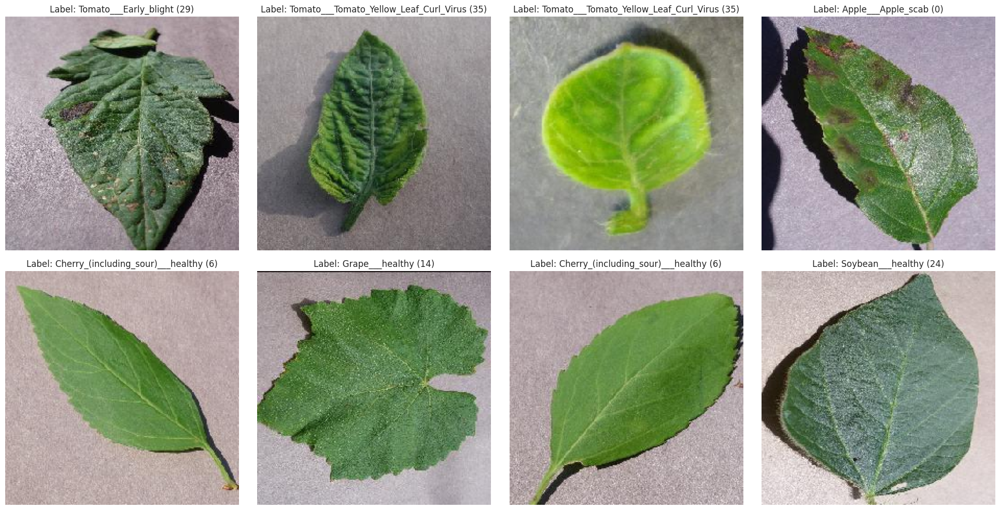

In [41]:
# Fonction pour afficher une image et son étiquette
def show_image(image, label, class_indices):
    class_labels = {v: k for k, v in class_indices.items()}  # Inverser le dictionnaire class_indices
    plt.imshow(image)
    plt.title(f"Label: {class_labels[int(label)]} ({int(label)})")
    plt.axis('off')

# Sélectionner quelques indices d'images à afficher
image_list = [0, 1, 2, 3, 4, 5, 6, 7]  # Modifié pour s'assurer que les indices sont dans la plage du batch

# Initialiser le générateur de lot
batch = next(iter(train_scaled_data))  # Obtenir le prochain lot d'images et d'étiquettes

# Afficher les images et leurs étiquettes
chs = 0
plt.figure(figsize=(20, 10))
for img_idx in image_list:
    chs += 1
    plt.subplot(2, 4, chs)
    image, label = batch[0][img_idx], batch[1][img_idx]  # Obtenir l'image et l'étiquette dans le lot
    show_image(image, label, train_scaled_data.class_indices)
    plt.xlabel(f"Index: {img_idx}", fontsize=10)
    plt.tight_layout()

plt.show()

<a id="5"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Réseau de neurones convolutifs (CNN) 🏋🏻</p>

In [42]:
# # Load pre-trained MobileNetV2 model
# base_model = MobileNetV2(input_shape=(224,224,3),
#                          include_top=False, weights='imagenet')

# # Freeze the pre-trained layers
# for layer in base_model.layers:
#     layer.trainable = False

# # Create a Sequential model
# model = Sequential()

# model.add(base_model)
# model.add(GlobalAveragePooling2D())
# model.add(Dense(100, activation='relu'))  # Add a dense layer with 1024 units
# model.add(Dense(100, activation='relu'))   # Add another dense layer with 512 units
# model.add(Dense(len(class_labels), activation='softmax'))

# model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',
#              metrics=['accuracy'])

# model.summary()


# Créer un modèle séquentiel avec une couche d'entrée explicite
model = Sequential()

model.add(Input(shape=(224, 224, 3)))
base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
model.add(base_model)

# Geler les couches pré-entraînées
for layer in base_model.layers:
    layer.trainable = False

model.add(GlobalAveragePooling2D())
model.add(Dense(100, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(len(class_labels), activation='softmax'))

# Compiler le modèle
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Afficher le résumé du modèle
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d_1  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_3 (Dense)             (None, 100)               128100    
                                                                 
 dense_4 (Dense)             (None, 100)               10100     
                                                                 
 dense_5 (Dense)             (None, 38)                3838      
                                                                 
Total params: 2400022 (9.16 MB)
Trainable params: 1420

<div style='border: 3px solid none; background-color:#ECFFDC; padding:10px'>

1. "model = Sequential()" crée un modèle séquentiel, qui est une pile linéaire de couches.

2. "model.add(Input(shape=(224, 224, 3)))" ajoute une couche d'entrée avec la forme (224, 224, 3) pour les images de 224x224 pixels avec 3 canaux couleur (RVB).

3. "base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')" charge le modèle MobileNetV2 pré-entraîné sur ImageNet sans les couches de classification au sommet.

4. "model.add(base_model)" ajoute le modèle MobileNetV2 à la pile de couches du modèle séquentiel.

5. "for layer in base_model.layers: layer.trainable = False" gèle les couches pré-entraînées de MobileNetV2 pour empêcher leur mise à jour pendant l'entraînement.

6. "model.add(GlobalAveragePooling2D())" ajoute une couche de pooling global pour réduire les dimensions spatiales.

7. "model.add(Dense(100, activation='relu'))" ajoute une couche dense avec 100 neurones et la fonction d'activation ReLU.

8. "model.add(Dense(100, activation='relu'))" ajoute une deuxième couche dense avec 100 neurones et la fonction d'activation ReLU.

9. "model.add(Dense(len(class_labels), activation='softmax'))" ajoute la couche de sortie avec un neurone par classe et la fonction d'activation softmax pour la classification multi-classes.

10. "model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])" compile le modèle avec l'optimiseur Adam, la fonction de perte de l'entropie croisée sparse, et l'exactitude comme métrique.

11. "model.summary()" affiche le résumé du modèle, y compris les détails des couches et des paramètres.

</div>

In [43]:
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', 
                               patience=3, 
                               restore_best_weights=True)

history = model.fit(train_scaled_data ,batch_size=256,epochs=100,
                verbose=1,
                validation_data=valid_scaled_data,
                callbacks=[early_stopping]) # epochs=5

Epoch 1/100
275/275 [==============================] - 247s 886ms/step - loss: 0.6546 - accuracy: 0.8198 - val_loss: 0.2646 - val_accuracy: 0.9156
Epoch 2/100
275/275 [==============================] - 249s 904ms/step - loss: 0.1919 - accuracy: 0.9390 - val_loss: 0.1917 - val_accuracy: 0.9376
Epoch 3/100
275/275 [==============================] - 250s 909ms/step - loss: 0.1392 - accuracy: 0.9540 - val_loss: 0.1596 - val_accuracy: 0.9482
Epoch 4/100
275/275 [==============================] - 250s 909ms/step - loss: 0.1081 - accuracy: 0.9651 - val_loss: 0.1417 - val_accuracy: 0.9529
Epoch 5/100
275/275 [==============================] - 253s 921ms/step - loss: 0.0916 - accuracy: 0.9703 - val_loss: 0.1298 - val_accuracy: 0.9575
Epoch 6/100
275/275 [==============================] - 252s 915ms/step - loss: 0.0741 - accuracy: 0.9759 - val_loss: 0.1293 - val_accuracy: 0.9557
Epoch 7/100
275/275 [==============================] - 258s 937ms/step - loss: 0.0635 - accuracy: 0.9794 - val_loss: 0

<div style='border: 3px solid none; background-color:#ECFFDC; padding:10px'>

1. L'import de "EarlyStopping" est une technique de régularisation qui arrête l'entraînement du modèle si la performance sur un ensemble de validation ne s'améliore pas pendant un certain nombre d'époques. (3 ici)

2. "early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)" configure l'early stopping :
   * monitor='val_loss' : surveille la perte de validation pour déterminer l'arrêt.
   * patience=3 : arrête l'entraînement si la perte de validation ne s'améliore pas après 3 époques consécutives.
   * restore_best_weights=True : restaure les poids du modèle au meilleur point de performance de validation observé.

3. "history = model.fit(train_scaled_data, batch_size=256, epochs=100, verbose=1, validation_data=valid_scaled_data, callbacks=[early_stopping])" entraîne le modèle :
   * train_scaled_data : données d'entraînement.
   * batch_size=256 : taille des lots d'images utilisés pour l'entraînement.
   * epochs=100 : nombre maximal d'époques pour l'entraînement.
   * verbose=1 : affiche les informations d'entraînement détaillées.
   * validation_data=valid_scaled_data : données de validation utilisées pour évaluer la performance du modèle après chaque époque.
   * callbacks=[early_stopping] : utilise l'early stopping pour arrêter l'entraînement si nécessaire.

</div>

In [61]:
# Save The Model
model.save("plant_disease_model.h5")

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

* Sauvegarde du Modèle en Format H5 : Le modèle est sauvegardé dans un fichier .h5 pour une utilisation ultérieure.

In [62]:
# Sauvegarder le modèle au format SavedModel
model.save("plant_disease_model")

# Convertir le modèle en fichier TFLite
converter = tf.lite.TFLiteConverter.from_saved_model("plant_disease_model")
tflite_model = converter.convert()

# Sauvegarder le modèle TFLite dans un fichier
with open("plant_disease_model.tflite", "wb") as f:
    f.write(tflite_model)

print("Model successfully converted to TFLite format and saved as plant_disease_model.tflite")

Summary on the non-converted ops:
---------------------------------
 * Accepted dialects: tfl, builtin, func
 * Non-Converted Ops: 112, Total Ops 186, % non-converted = 60.22 %
 * 112 ARITH ops

- arith.constant:  112 occurrences  (f32: 110, i32: 2)



  (f32: 10)
  (f32: 35)
  (f32: 17)
  (f32: 3)
  (f32: 1)
  (f32: 4)
  (f32: 1)


Model successfully converted to TFLite format and saved as plant_disease_model.tflite


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

* Sauvegarde en Format TFLite : Le modèle est converti et sauvegardé en format TensorFlow Lite pour être utilisé dans des applications mobiles ou embarquées.

In [46]:
loss,acc = model.evaluate(train_scaled_data)
print("Loss on Train data:",loss)
print("Accuracy on Train data:",acc)

loss1,acc1 = model.evaluate(valid_scaled_data)

print("Loss on Test data:",loss1)
print("Accuracy on Test data:",acc1)

275/275 [==============================] - 207s 751ms/step - loss: 0.0206 - accuracy: 0.9944
Loss on Train data: 0.020636318251490593
Accuracy on Train data: 0.994423508644104
69/69 [==============================] - 49s 712ms/step - loss: 0.1110 - accuracy: 0.9663
Loss on Test data: 0.11102521419525146
Accuracy on Test data: 0.9663100242614746


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

* Évaluation sur les Données d'Entrainement : Évalue la perte et l'exactitude du modèle sur les données d'entraînement.
* Évaluation sur les Données de Validation : Évalue la perte et l'exactitude du modèle sur les données de validation.

<a id="6"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Interprétation des résultats 📊</p>

In [47]:
acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]

loss = history.history["loss"]
val_loss = history.history["val_loss"]

# Déterminer le nombre d'époques à partir de la longueur de l'historique
EPOCHS = len(acc)

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

* Historique de l'Entrainement : Extraction des métriques de l'entraînement et de la validation (exactitude et perte) pour les époques.

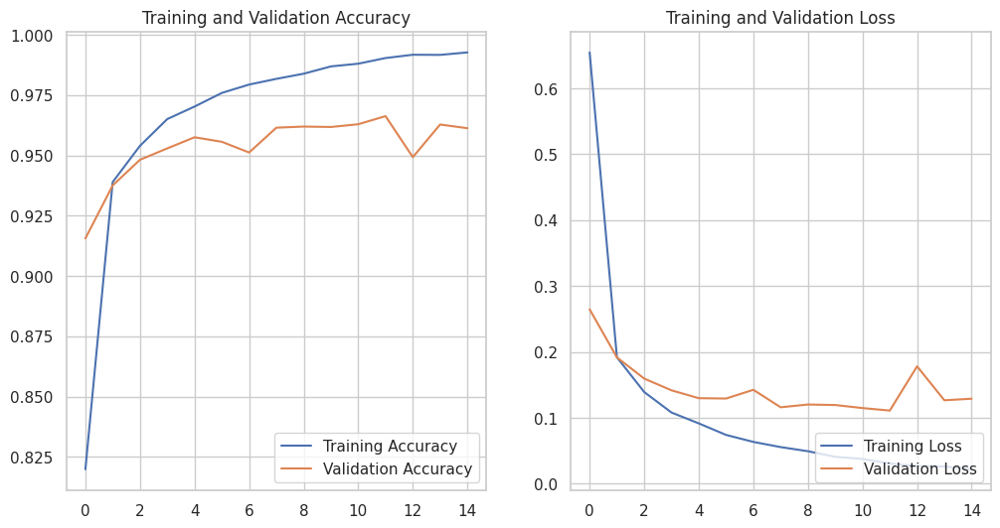

In [48]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label="Training Accuracy")
plt.plot(range(EPOCHS), val_acc, label="Validation Accuracy")
plt.legend(loc="lower right")
plt.title("Training and Validation Accuracy")

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label="Training Loss")
plt.plot(range(EPOCHS), val_loss, label="Validation Loss")
plt.legend(loc="lower right")
plt.title("Training and Validation Loss")
plt.show()

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

#### Description du Graphique

**Training and Validation Accuracy (Précision d'entraînement et de validation)** :

- **Axe des X (Horizontal)** : Représente le nombre d'époques d'entraînement.
- **Axe des Y (Vertical)** : Représente la précision (accuracy).
- **Courbe Bleue (Training Accuracy)** : Montre l'évolution de la précision sur les données d'entraînement au fil des époques.
- **Courbe Orange (Validation Accuracy)** : Montre l'évolution de la précision sur les données de validation au fil des époques.

**Training and Validation Loss (Perte d'entraînement et de validation)** :

- **Axe des X (Horizontal)** : Représente le nombre d'époques d'entraînement.
- **Axe des Y (Vertical)** : Représente la perte (loss).
- **Courbe Bleue (Training Loss)** : Montre l'évolution de la perte sur les données d'entraînement au fil des époques.
- **Courbe Orange (Validation Loss)** : Montre l'évolution de la perte sur les données de validation au fil des époques.

#### Utilité du Graphique

Ces graphiques sont essentiels pour évaluer comment le modèle se comporte pendant l'entraînement et la validation :

**Suivi de la Performance** :

- Ils permettent de suivre l'amélioration de la précision et la diminution de la perte au fur et à mesure que le modèle apprend à partir des données d'entraînement.
- Une courbe de précision qui monte et une courbe de perte qui descend sont des signes que le modèle apprend correctement.

**Détection du Surapprentissage (Overfitting)** :

- Si la courbe de précision d'entraînement continue à monter alors que la courbe de précision de validation se stabilise ou diminue, cela peut indiquer un surapprentissage.
- De même, si la courbe de perte d'entraînement continue à descendre tandis que la courbe de perte de validation se stabilise ou augmente, cela peut aussi indiquer un surapprentissage.

**Évaluation de la Généralisation** :

- Une bonne généralisation est indiquée par des courbes de précision et de perte similaires pour l'entraînement et la validation.
- Si les courbes de validation sont proches des courbes d'entraînement, cela signifie que le modèle généralise bien sur des données qu'il n'a pas vues.

#### Analyse des Résultats

**Graphique de gauche : Training and Validation Accuracy**

- **Précision d'entraînement (Training Accuracy)** :
  - La courbe bleue montre une augmentation constante et régulière de la précision pendant l'entraînement. Elle approche les 100 % au fil des époques, indiquant que le modèle apprend bien les données d'entraînement.
  - Cette tendance est typique pour un modèle bien conçu et correctement ajusté.

- **Précision de validation (Validation Accuracy)** :
  - La courbe orange montre une augmentation rapide au début, suivie d'une stabilisation autour de 95 %.
  - La légère fluctuation vers la fin peut être due à la nature des données de validation ou à de légères variations dans l'échantillonnage des données.

**Graphique de droite : Training and Validation Loss**

- **Perte d'entraînement (Training Loss)** :
  - La courbe bleue montre une diminution constante de la perte pendant l'entraînement, ce qui est attendu à mesure que le modèle apprend à mieux ajuster les données d'entraînement.
  - La perte approche une valeur proche de zéro, indiquant que le modèle ajuste bien les données d'entraînement.

- **Perte de validation (Validation Loss)** :
  - La courbe orange montre une diminution initiale rapide, suivie d'une stabilisation et de légères fluctuations autour de 0.1.
  - Les fluctuations peuvent indiquer une légère variance dans les données de validation, mais la perte reste relativement basse.

#### Conclusion Générale

Les résultats affichés dans les courbes de précision et de perte montrent que le modèle est bien entraîné et généralise bien sur les données de validation. Quelques points à considérer pour une optimisation future :

1. **Évaluation continue** :
   - Continuez à surveiller les fluctuations dans la perte de validation pour s'assurer qu'elles ne deviennent pas significatives.
   - Une validation croisée pourrait être envisagée pour confirmer la robustesse du modèle.

2. **Amélioration des données** :
   - Si possible, collectez plus de données de validation pour réduire les fluctuations et obtenir une meilleure estimation des performances du modèle.

3. **Hyperparamètres** :
   - Bien que le modèle semble bien fonctionner, vous pouvez expérimenter avec différents paramètres comme le taux d'apprentissage, la taille des lots, ou des techniques de régularisation pour voir s'il y a des améliorations supplémentaires possibles.

Globalement, les courbes montrent que le modèle est performant et qu'il n'y a pas de signes évidents de surapprentissage ou de sous-apprentissage. Vous êtes sur la bonne voie pour un modèle robuste de détection des maladies des plantes.

</div>

69/69 [==============================] - 50s 714ms/step
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.98      0.95      0.97       504
                                 Apple___Black_rot       0.97      0.99      0.98       497
                          Apple___Cedar_apple_rust       0.98      0.98      0.98       440
                                   Apple___healthy       1.00      0.99      0.99       502
                               Blueberry___healthy       0.99      0.98      0.99       454
          Cherry_(including_sour)___Powdery_mildew       0.99      1.00      0.99       421
                 Cherry_(including_sour)___healthy       0.99      0.99      0.99       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.98      0.88      0.93       410
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       477
               Corn_(ma

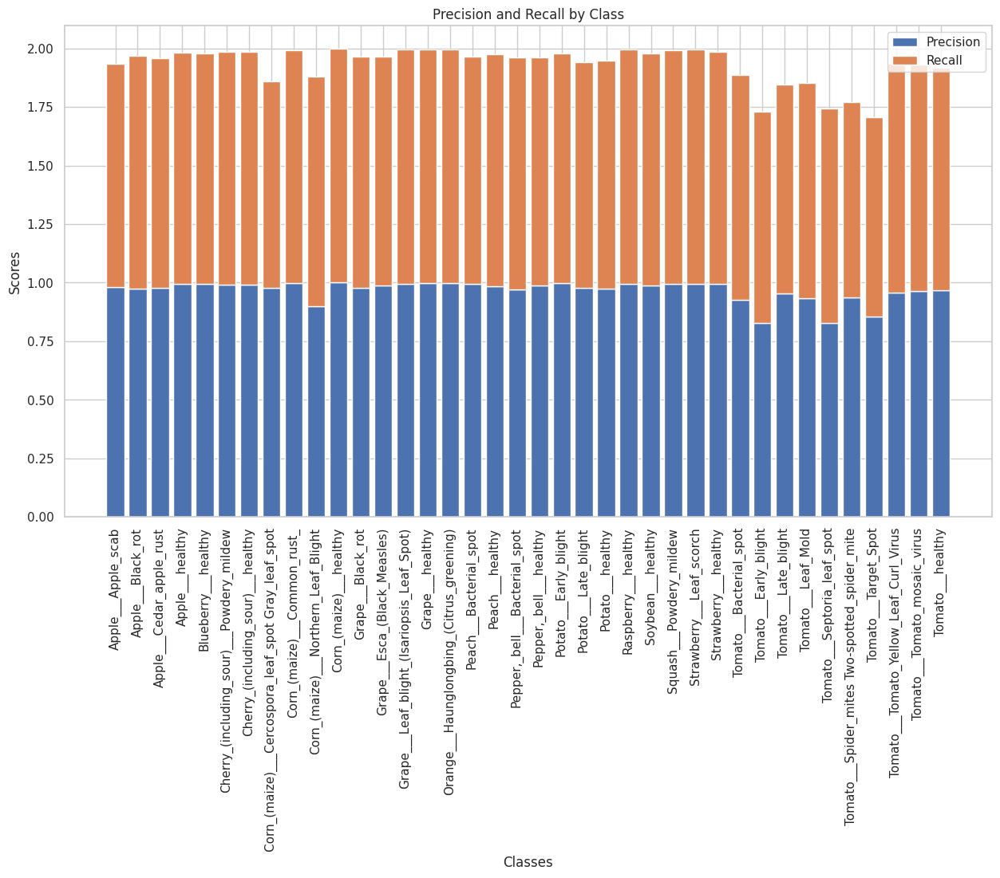

In [49]:
from sklearn.metrics import classification_report

# Prédire les labels pour les données de validation
y_pred = model.predict(valid_scaled_data)
y_pred_classes = y_pred.argmax(axis=-1)
y_true = valid_scaled_data.classes

# Afficher le rapport de classification
report = classification_report(y_true, y_pred_classes, target_names=class_labels)
print(report)

# Extraction des précisions et des rappels pour chaque classe
report_dict = classification_report(y_true, y_pred_classes, target_names=class_labels, output_dict=True)
precision = [report_dict[label]['precision'] for label in class_labels]
recall = [report_dict[label]['recall'] for label in class_labels]

# Afficher les précisions et les rappels par classe
plt.figure(figsize=(15, 8))
plt.bar(range(len(class_labels)), precision, label='Precision')
plt.bar(range(len(class_labels)), recall, bottom=precision, label='Recall')
plt.xticks(range(len(class_labels)), class_labels, rotation=90)
plt.xlabel('Classes')
plt.ylabel('Scores')
plt.title('Precision and Recall by Class')
plt.legend()
plt.grid(True)
plt.show()

<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>

### Interprétation des Résultats

#### Description du Graphique

Ce graphique montre les précisions (precision) et les rappels (recall) pour chaque classe de votre modèle de détection des maladies des plantes. Ces mesures sont essentielles pour évaluer la performance du modèle par classe.

- **Précision (Precision)** : La précision pour une classe donnée est le rapport du nombre de prédictions correctes pour cette classe sur le nombre total d'exemples où cette classe a été prédite (vrai positifs / (vrai positifs + faux positifs)). Une haute précision signifie que la classe prédite est rarement incorrecte.
- **Rappel (Recall)** : Le rappel pour une classe donnée est le rapport du nombre de prédictions correctes pour cette classe sur le nombre total d'exemples de cette classe dans les données réelles (vrai positifs / (vrai positifs + faux négatifs)). Un haut rappel signifie que la plupart des exemples de cette classe sont correctement identifiés par le modèle.

#### Utilité du Graphique

Ce graphique est crucial pour plusieurs raisons :

1. **Identification des Classes Fortes et Faibles** :
   - Il permet d'identifier quelles classes le modèle classe bien (haute précision et rappel) et lesquelles posent problème (basse précision et/ou rappel).
   - En visualisant ces métriques pour chaque classe, vous pouvez voir où le modèle performe bien et où il pourrait nécessiter des améliorations.

2. **Équilibrage des Performances** :
   - Un modèle équilibré aura des précisions et des rappels relativement uniformes pour toutes les classes.
   - Des différences marquées entre les classes peuvent indiquer un déséquilibre dans les données d'entraînement ou des problèmes spécifiques dans la classification de certaines classes.

#### Analyse des Résultats

**Précision et Rappel**

- **Classes avec Haute Précision et Rappel** :
  - La plupart des classes montrent des valeurs de précision et de rappel très élevées (proches de 1.0), ce qui indique que le modèle performe très bien pour ces classes.
  - Par exemple, les classes comme `Apple___healthy`, `Corn_(maize)___healthy`, et `Grape___healthy` montrent des scores parfaits, indiquant une excellente performance de classification pour ces catégories.

- **Classes avec Précision et Rappel Moins Élevés** :
  - Quelques classes montrent des scores légèrement inférieurs, bien que toujours élevés. Par exemple, `Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot` a une précision et un rappel un peu plus bas, ce qui pourrait indiquer une certaine confusion avec d'autres classes similaires.
  - Ces petites variations peuvent être dues à la similarité visuelle entre les maladies des plantes ou à un nombre d'exemples insuffisant pour certaines classes dans les données d'entraînement.

#### Conclusion Générale

Les résultats montrent que le modèle a une performance globale excellente avec des scores de précision et de rappel très élevés pour la plupart des classes. Quelques points à considérer pour une optimisation future :

1. **Amélioration des Données** :
   - Si certaines classes montrent des scores moins élevés, envisagez de collecter plus de données pour ces classes spécifiques.
   - Assurez-vous que les données sont équilibrées pour éviter que certaines classes soient sous-représentées.

2. **Ajustements du Modèle** :
   - Expérimentez avec des techniques de régularisation ou d'augmentation des données pour améliorer encore la performance du modèle, en particulier pour les classes qui ont des scores légèrement inférieurs.

3. **Validation Croisée** :
   - Utilisez des techniques de validation croisée pour confirmer que le modèle généralise bien et que les performances observées ne sont pas dues à des particularités des données de validation actuelles.

Globalement, les résultats sont très positifs et montrent que le modèle est capable de détecter efficacement les maladies des plantes avec une haute précision et un haut rappel pour la plupart des classes.

</div>

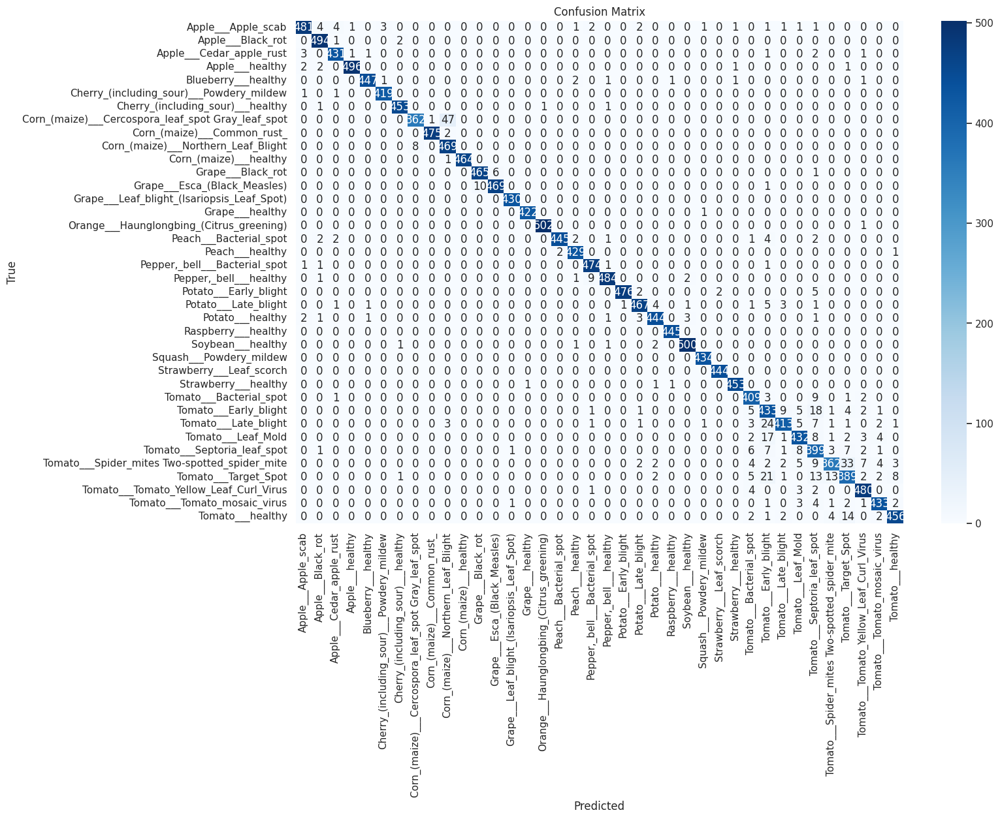

In [51]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Calculer la matrice de confusion
cm = confusion_matrix(y_true, y_pred_classes)

# Afficher la matrice de confusion
plt.figure(figsize=(15, 10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

<div style = 'border : 3px solid non; background-color:#ECFFDC; padding:10px'>

### Interprétation des Résultats

#### Description du Graphique

Ce graphique montre la matrice de confusion pour le modèle de détection des maladies des plantes. Une matrice de confusion est une méthode pour évaluer la performance d'un modèle de classification en comparant les prédictions du modèle avec les véritables étiquettes des données de validation.

- **Axes** :
  - **Axe des X (Predicted)** : Représente les classes prédites par le modèle.
  - **Axe des Y (True)** : Représente les classes réelles des données.

- **Cellules de la Matrice** :
  - Chaque cellule \((i, j)\) de la matrice montre le nombre d'exemples de la classe \(i\) qui ont été prédits comme étant de la classe \(j\).
  - Les valeurs sur la diagonale de la matrice représentent les prédictions correctes, où la classe prédite correspond à la classe réelle.
  - Les valeurs hors diagonale représentent les erreurs de classification, où la classe prédite ne correspond pas à la classe réelle.

#### Utilité du Graphique

Ce graphique est crucial pour plusieurs raisons :

1. **Identification des Erreurs de Classification** :
   - Permet de voir où le modèle se trompe en prédiction, en identifiant quelles classes sont souvent confondues les unes avec les autres.
   - Aide à diagnostiquer des problèmes potentiels dans les données ou dans le modèle.

2. **Évaluation Globale du Modèle** :
   - Fournit une vue d'ensemble de la performance du modèle sur toutes les classes.
   - Les valeurs sur la diagonale étant élevées indiquent que le modèle a une bonne précision globale.

3. **Amélioration du Modèle** :
   - En analysant les erreurs spécifiques, il est possible de prendre des mesures pour améliorer la performance du modèle, comme ajuster les hyperparamètres, collecter plus de données pour les classes problématiques, ou utiliser des techniques de traitement de données plus avancées.

#### Analyse des Résultats

**Matrice de Confusion**

- **Classes avec Hautes Précisions** :
  - Les valeurs élevées sur la diagonale, comme pour `Apple___Apple_scab`, `Corn_(maize)___healthy`, et `Grape___healthy`, montrent que le modèle prédit correctement ces classes la plupart du temps.
  - Ces classes ont peu de confusion avec les autres, indiquant une bonne discrimination du modèle pour ces catégories.

- **Classes avec Confusions** :
  - Certaines classes montrent des valeurs hors diagonale plus élevées, comme `Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot` et `Tomato___Spider_mites Two-spotted_spider_mite`, ce qui indique que ces classes sont parfois confondues avec d'autres.
  - Ces confusions peuvent être dues à des similarités visuelles entre les maladies des plantes ou à des déséquilibres dans les données d'entraînement.

#### Conclusion Générale

La matrice de confusion montre que le modèle a une excellente performance globale avec une forte précision pour la plupart des classes. Quelques points à considérer pour une optimisation future :

1. **Amélioration des Données** :
   - Si certaines classes montrent des confusions fréquentes, envisage de collecter plus de données pour ces classes spécifiques.
   - Assure-toi que les données sont équilibrées pour éviter que certaines classes soient sous-représentées.

2. **Ajustements du Modèle** :
   - Expérimente avec des techniques de régularisation ou d'augmentation des données pour améliorer encore la performance du modèle, en particulier pour les classes qui ont des confusions fréquentes.

3. **Validation Croisée** :
   - Utilise des techniques de validation croisée pour confirmer que le modèle généralise bien et que les performances observées ne sont pas dues à des particularités des données de validation actuelles.

Globalement, les résultats sont très positifs et montrent que le modèle est capable de détecter efficacement les maladies des plantes avec une haute précision pour la plupart des classes.

</div>

In [66]:
from sklearn.metrics import classification_report

# Prédire les labels pour les données de validation
y_pred = model.predict(valid_scaled_data)
y_pred_classes = np.argmax(y_pred, axis=-1)
y_true = valid_scaled_data.classes

# Afficher le rapport de classification
report = classification_report(y_true, y_pred_classes, target_names=class_labels)
print(report)

69/69 [==============================] - 47s 681ms/step
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.98      0.95      0.97       504
                                 Apple___Black_rot       0.97      0.99      0.98       497
                          Apple___Cedar_apple_rust       0.98      0.98      0.98       440
                                   Apple___healthy       1.00      0.99      0.99       502
                               Blueberry___healthy       0.99      0.98      0.99       454
          Cherry_(including_sour)___Powdery_mildew       0.99      1.00      0.99       421
                 Cherry_(including_sour)___healthy       0.99      0.99      0.99       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.98      0.88      0.93       410
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       477
               Corn_(ma

<a id="7"></a>
# <p style="padding:10px;background-color:#2E8B57 ;margin:0;color:#ffffff;font-size:100%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Teste du modèle 🧪</p>

In [52]:
# Load the test image
from tensorflow.keras.preprocessing import image
img_path = "/kaggle/input/new-plant-diseases-dataset/test/test/AppleScab1.JPG"
img = image.load_img(img_path, target_size=(224, 224))
#img
img_array = image.img_to_array(img)
print(img_array.shape) 
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
# Scale The Data
img_array = img_array/255
print(img_array.shape)

(224, 224, 3)
(1, 224, 224, 3)


In [53]:
y_pred = model.predict(img_array)
y_pred

1/1 [==============================] - 2s 2s/step


array([[9.8007327e-01, 6.0423083e-08, 1.8766670e-02, 3.5448093e-07,
        2.3272072e-07, 1.8577522e-05, 9.3858716e-06, 2.3777807e-07,
        1.4186120e-10, 2.1297865e-06, 7.9356965e-08, 1.7840264e-08,
        2.6285106e-08, 5.9394281e-11, 1.7524128e-11, 4.9509407e-07,
        2.2605373e-06, 4.3010491e-11, 1.4080686e-07, 4.1414039e-10,
        9.0685465e-10, 2.2003478e-06, 1.1984349e-09, 1.1317170e-07,
        3.9393063e-07, 2.7558583e-12, 3.8805197e-07, 1.8910690e-08,
        4.3518758e-06, 7.1354793e-06, 7.2767858e-09, 2.5264624e-06,
        4.1111475e-06, 8.4089118e-11, 1.0637822e-08, 1.1047411e-03,
        1.5357011e-09, 4.1656175e-12]], dtype=float32)

In [54]:
np.argmax(y_pred[0])

0

In [55]:
len(y_pred[0])

38

In [56]:
class_labels[np.argmax(y_pred[0])]

'Apple___Apple_scab'

In [57]:
dict_class = {'Label':class_labels}
dict_class

{'Label': ['Apple___Apple_scab',
  'Apple___Black_rot',
  'Apple___Cedar_apple_rust',
  'Apple___healthy',
  'Blueberry___healthy',
  'Cherry_(including_sour)___Powdery_mildew',
  'Cherry_(including_sour)___healthy',
  'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
  'Corn_(maize)___Common_rust_',
  'Corn_(maize)___Northern_Leaf_Blight',
  'Corn_(maize)___healthy',
  'Grape___Black_rot',
  'Grape___Esca_(Black_Measles)',
  'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
  'Grape___healthy',
  'Orange___Haunglongbing_(Citrus_greening)',
  'Peach___Bacterial_spot',
  'Peach___healthy',
  'Pepper,_bell___Bacterial_spot',
  'Pepper,_bell___healthy',
  'Potato___Early_blight',
  'Potato___Late_blight',
  'Potato___healthy',
  'Raspberry___healthy',
  'Soybean___healthy',
  'Squash___Powdery_mildew',
  'Strawberry___Leaf_scorch',
  'Strawberry___healthy',
  'Tomato___Bacterial_spot',
  'Tomato___Early_blight',
  'Tomato___Late_blight',
  'Tomato___Leaf_Mold',
  'Tomato___Septoria_leaf_s

In [58]:
dict_class['Label'][2]

'Apple___Cedar_apple_rust'

In [59]:
import json

with open("class_labels.json",'w') as file:
    json.dump(dict_class,file)

In [63]:
# Function to make predict
import tensorflow as tf
import numpy as np

loaded_model = tf.keras.models.load_model('/kaggle/working/plant_disease_model.h5')

# Function to load and preprocess image
def load_image(img_path):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Convert single image to a batch
    img_array = img_array / 255.0  # Normalize the image as done in preprocessing
    return img_array

# Example usage
img_path = '/kaggle/input/new-plant-diseases-dataset/test/test/AppleCedarRust1.JPG'
img = load_image(img_path)
predictions = loaded_model.predict(img)
predicted_class = np.argmax(predictions, axis=1)
print(f'Predicted class: {predicted_class}')
print(class_labels[int(predicted_class)] )


1/1 [==============================] - 1s 846ms/step
Predicted class: [2]
Apple___Cedar_apple_rust


In [64]:
import os
import tensorflow as tf
import numpy as np

# Load the trained model
loaded_model = tf.keras.models.load_model('/kaggle/working/plant_disease_model.h5')

# Function to load and preprocess image
def load_image(img_path):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Convert single image to a batch
    img_array = img_array / 255.0  # Normalize the image as done in preprocessing
    return img_array

# Example usage
test_folder = '/kaggle/input/new-plant-diseases-dataset/test/test/'

def predict_images_in_folder(test_folder):
    for file in os.listdir(test_folder):
        img_path = os.path.join(test_folder, file)
        img = load_image(img_path)
        predictions = loaded_model.predict(img)
        predicted_class = np.argmax(predictions, axis=1)[0]  # Extract single prediction
        print(f'Image: {file}, Predicted class: {predicted_class}, Predicted label: {file}')

# Call function to predict and compare labels for all images in the test folder
predict_images_in_folder(test_folder)


1/1 [==============================] - 1s 808ms/step
Image: TomatoEarlyBlight6.JPG, Predicted class: 29, Predicted label: TomatoEarlyBlight6.JPG
1/1 [==============================] - 0s 23ms/step
Image: TomatoYellowCurlVirus4.JPG, Predicted class: 35, Predicted label: TomatoYellowCurlVirus4.JPG
1/1 [==============================] - 0s 22ms/step
Image: TomatoYellowCurlVirus6.JPG, Predicted class: 35, Predicted label: TomatoYellowCurlVirus6.JPG
1/1 [==============================] - 0s 23ms/step
Image: PotatoHealthy2.JPG, Predicted class: 22, Predicted label: PotatoHealthy2.JPG
1/1 [==============================] - 0s 22ms/step
Image: TomatoYellowCurlVirus5.JPG, Predicted class: 35, Predicted label: TomatoYellowCurlVirus5.JPG
1/1 [==============================] - 0s 22ms/step
Image: PotatoEarlyBlight2.JPG, Predicted class: 20, Predicted label: PotatoEarlyBlight2.JPG
1/1 [==============================] - 0s 22ms/step
Image: TomatoYellowCurlVirus3.JPG, Predicted class: 35, Predicted l